### Zero shot image classification

We'll use zero shot image classification attempting to classify all the images in the dataset

[see also](https://huggingface.co/docs/transformers/tasks/zero_shot_image_classification)

In [1]:
import matplotlib.pyplot as plt

from transformers import pipeline

from PIL import Image
import requests

from tqdm import tqdm

import pandas as pd

import numpy as np

import os

/opt/homebrew/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Utility functions

In [2]:
def process_predictions(predictions):
    first_score = predictions[0]['score']
    if first_score >= 0.61:
        return [predictions[0]]
    elif 0.40 <= first_score <= 0.60:
        if (predictions[0]['score'] - predictions[1]['score']) * 100 <= 10:
            return predictions[:2]
        elif (predictions[0]['score'] + predictions[1]['score']) * 100 > 90:
            return predictions[:2]
    elif first_score < 0.40:
        scores = [pred['score'] for pred in predictions]
        if np.mean(scores) > np.median(scores):
            return predictions[:3]
        elif (predictions[0]['score'] - predictions[1]['score']) * 100 <= 10:
            return predictions[:2]
       
    return predictions[:3]

In [3]:
checkpoint = "openai/clip-vit-large-patch14"
detector = pipeline(model=checkpoint, task="zero-shot-image-classification")

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor confi

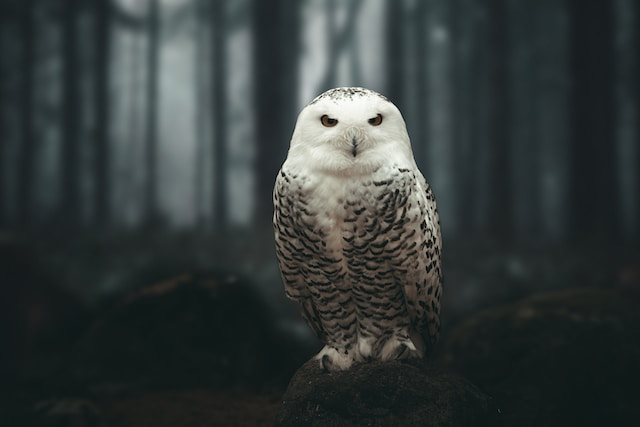

In [4]:
url = "https://unsplash.com/photos/g8oS8-82DxI/download?ixid=MnwxMjA3fDB8MXx0b3BpY3x8SnBnNktpZGwtSGt8fHx8fDJ8fDE2NzgxMDYwODc&force=true&w=640"
image = Image.open(requests.get(url, stream=True).raw)

image

In [5]:
predictions = detector(image, candidate_labels=["fox", "bear", "seagull", "owl"])
predictions

[{'score': 0.9993506073951721, 'label': 'owl'},
 {'score': 0.0004959418438374996, 'label': 'seagull'},
 {'score': 8.070766489254311e-05, 'label': 'fox'},
 {'score': 7.274229574250057e-05, 'label': 'bear'}]

In [6]:
# Defining classes
classes = ["porcupine", "wild boar", "fox", "marten", "hare", "deer", "badger", "wolf", "horse", "dog", "cat", "buzzard", "heron", "mallard", "squirrel"]

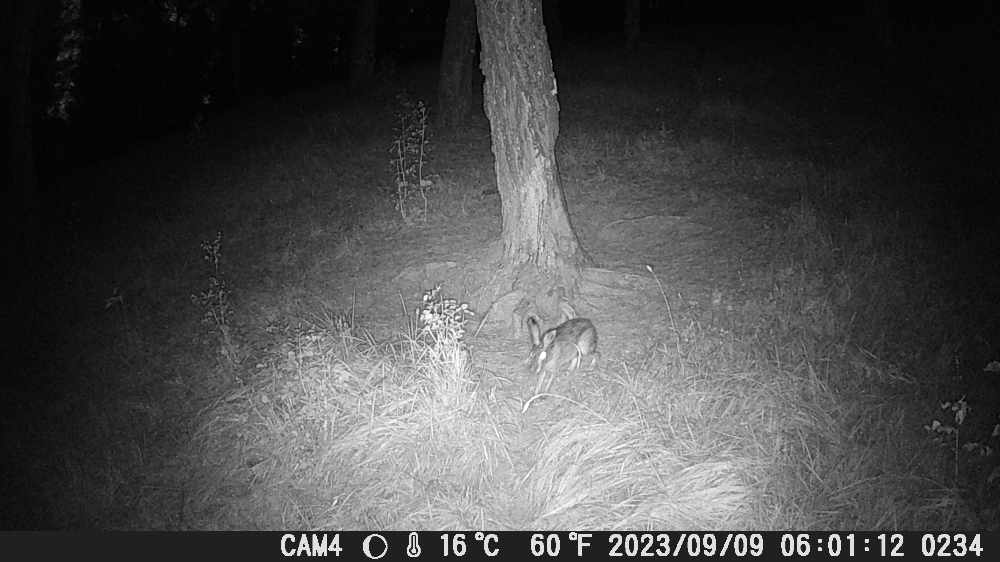

In [7]:
# Let's try with some of our images
#image = Image.open("images/aculei-images/TF_ACULEI_16613_DSCF0058.jpg")
#image = Image.open("images/aculei-images/TF_ACULEI_16735_DSCF0359.jpg")
image = Image.open("images/aculei-images/TF_ACULEI_16698_DSCF0234.jpg")

image

In [8]:
predictions = detector(image, candidate_labels=classes)
predictions

[{'score': 0.9132580757141113, 'label': 'hare'},
 {'score': 0.059311870485544205, 'label': 'fox'},
 {'score': 0.006971708033233881, 'label': 'deer'},
 {'score': 0.006612916011363268, 'label': 'wolf'},
 {'score': 0.005988281685858965, 'label': 'wild boar'},
 {'score': 0.005443071946501732, 'label': 'marten'},
 {'score': 0.0014008565340191126, 'label': 'squirrel'},
 {'score': 0.00042855434003286064, 'label': 'buzzard'},
 {'score': 0.0002139936259482056, 'label': 'badger'},
 {'score': 0.00020969736215192825, 'label': 'porcupine'},
 {'score': 6.040274820406921e-05, 'label': 'cat'},
 {'score': 5.226135908742435e-05, 'label': 'dog'},
 {'score': 2.183049036830198e-05, 'label': 'heron'},
 {'score': 1.5285902918549255e-05, 'label': 'mallard'},
 {'score': 1.1177775377291255e-05, 'label': 'horse'}]

Let's see some more images to be sure the model performs well

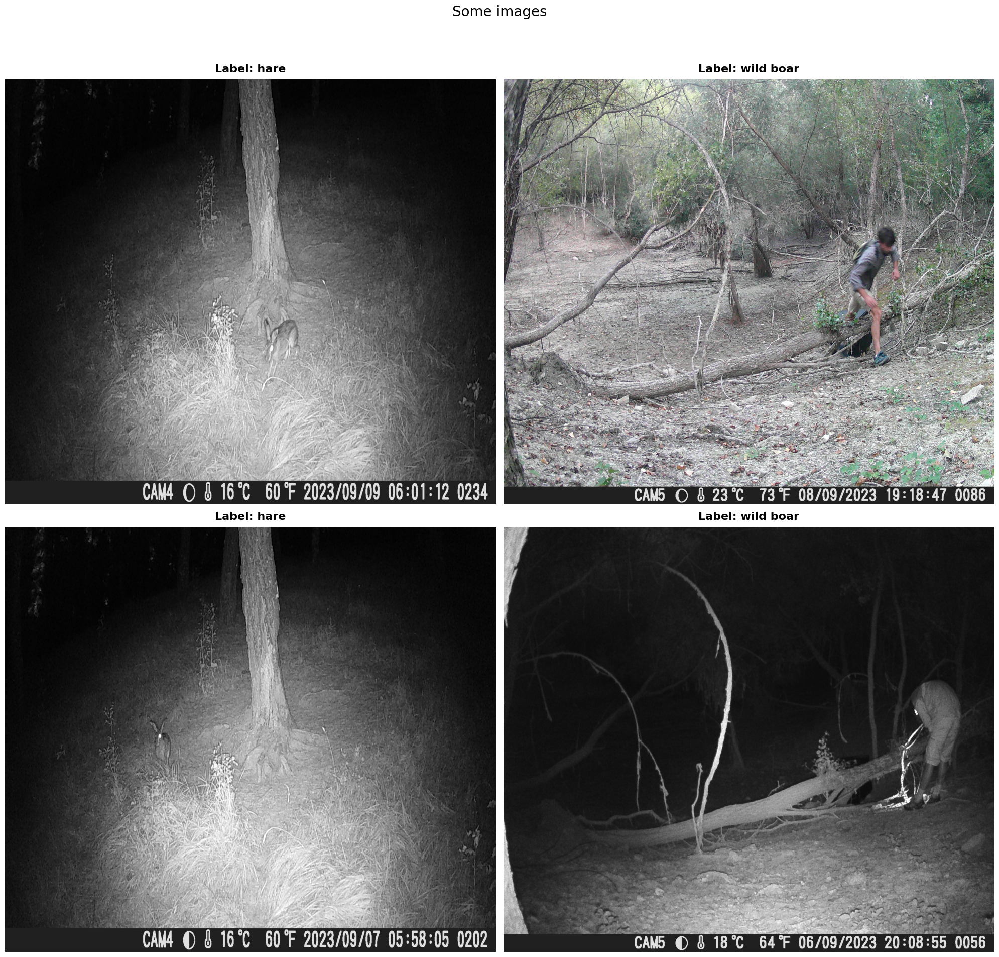

In [9]:
# images_to_test = ["images/aculei-images/TF_ACULEI_16595_DSCF0137.jpg", "images/aculei-images/TF_ACULEI_12307_DSCF0215.jpg", 
#                   "images/aculei-images/TF_ACULEI_15_DSCF0057.jpg", "images/aculei-images/TF_ACULEI_180_IMAG0047.jpg"]

# images_to_test = ["images/aculei-images/TF_ACULEI_16770_DSCF0494.jpg", "images/aculei-images/TF_ACULEI_16567_DSCF0121.jpg", 
#                   "images/aculei-images/TF_ACULEI_16585_DSCF0043.jpg", "images/aculei-images/TF_ACULEI_16265_DSCF0224.jpg"]

images_to_test = ["images/aculei-images/TF_ACULEI_16698_DSCF0234.jpg", "images/aculei-images/TF_ACULEI_16697_DSCF0086.jpg",
                  "images/aculei-images/TF_ACULEI_16691_DSCF0202.jpg", "images/aculei-images/TF_ACULEI_16686_DSCF0056.jpg"]

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(20, 20))
fig.suptitle('Some images', fontsize=20)

axes = [ax1, ax2, ax3, ax4]
    
for i, ax in enumerate(axes):
    image_path = images_to_test[i]
    image = Image.open(image_path)

    predictions = detector(image, candidate_labels=classes)

    label = predictions[0]['label']
    
    ax.imshow(image, aspect='auto')
    ax.axis('off')

    ax.set_title(f"Label: {label}", fontsize=16, fontweight='bold', pad=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [10]:
images_dir = "images/aculei-images"
datasets_dir = "datasets"
df = pd.read_csv(datasets_dir + "/aculei.csv")

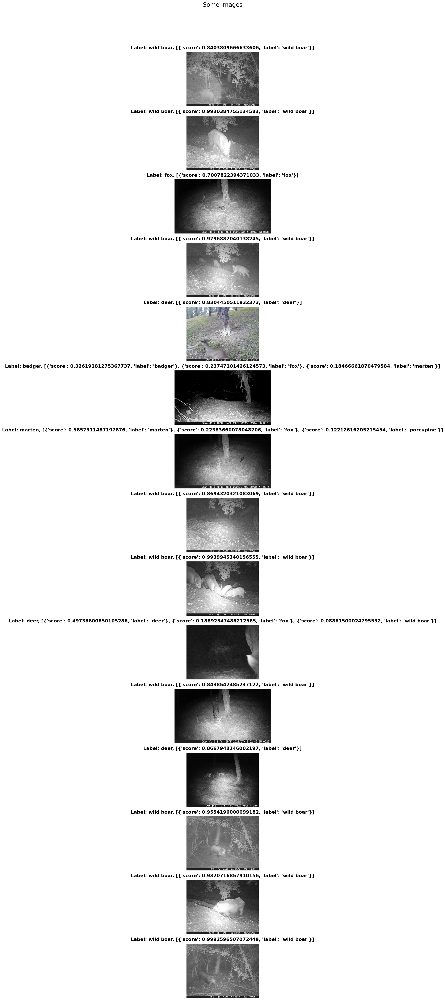

In [11]:
valid_rows = df.sample(15)

fig, axes = plt.subplots(15, 1, figsize=(50, 50))
fig.suptitle('Some images', fontsize=20)
    
for i, ax in enumerate(axes):
    image_path = os.path.join(images_dir, valid_rows.iloc[i]['image_name'])
    image = Image.open(image_path)
    predictions = detector(image, candidate_labels=classes)

    label = predictions[0]['label']
    
    ax.imshow(image, aspect='equal')  # Change aspect to 'equal'
    ax.axis('off')
    results = process_predictions(predictions)
    ax.set_title(f"Label: {label}, {results}", fontsize=16, fontweight='bold', pad=10)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

Now we're ready to classify all the images in the dataset and produce a new version of it

In [12]:
images_dir = "images/aculei-images"
datasets_dir = "datasets"

In [13]:
df = pd.read_csv(datasets_dir + "/aculei.csv", index_col=0)

In [14]:
for index, row in tqdm(df.iterrows(), total=len(df)):
    image_path = os.path.join(images_dir, row['image_name'])
    if os.path.isdir(image_path) and image_path.startswith("."):
        continue 

    image = Image.open(image_path)
    
    predictions = detector(image, candidate_labels=classes)
    labels = process_predictions(predictions)
    try: 
        df.loc[index, 'label1'] = labels[0]["label"] if len(labels) > 0 else None
        df.loc[index, 'label2'] = labels[1]["label"] if len(labels) > 1 else None
        df.loc[index, 'label3'] = labels[2]["label"] if len(labels) > 2 else None
    except :
        continue


huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)
  0%|          | 0/16874 [00:00<?, ?it/s]

100%|██████████| 16874/16874 [3:42:15<00:00,  1.27it/s]  


In [15]:
df.to_pickle(datasets_dir + "/animals.pkl")
